In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import random
from PIL import Image
import tensorflow as tf
from tensorflow import keras
from keras import layers
from tensorflow.keras.preprocessing.image import load_img, ImageDataGenerator, img_to_array
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.ensemble import RandomForestClassifier
import seaborn as sns
from keras import regularizers
from sklearn.svm import SVC
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from collections import Counter
from sklearn.cluster import KMeans
from tensorflow.keras.applications import MobileNetV2
from tensorflow.keras import ops

2024-12-11 01:47:28.401390: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:485] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-11 01:47:28.486287: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:8454] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-11 01:47:28.510577: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1452] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-12-11 01:47:28.674786: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-12-11 01:47:30.476653: W tensorflow/compiler/tf2

In [2]:
def getPredictionsTrain(model, dataset):
    y_pred = []  # store predicted labels
    y_true = []  # store true labels
    
    # Reset generator to start from the beginning
    dataset.reset()
  
    # Iterate over the dataset
    for _ in range(dataset.num_batches):
        image_batch, label_batch = next(dataset)
        # append true labels
        y_true.append(label_batch)
        # compute predictions
        preds = model.predict(image_batch, verbose=0)
        # append predicted labels
        y_pred.append(np.argmax(preds, axis=-1))

    # convert the true and predicted labels into tensors
    y_true = tf.concat([tf.convert_to_tensor(item) for item in y_true], axis=0)
    y_pred_classes = tf.concat([tf.convert_to_tensor(item) for item in y_pred], axis=0)
    class_labels = list(dataset.class_indices.keys())

    return y_true, y_pred_classes, class_labels

In [3]:
train_datagen = ImageDataGenerator(rescale=1./255)
val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)
batch_size = 32 
img_size = (128, 128)

print("Train_ds:")
train_generator = train_datagen.flow_from_directory(
    directory='bird_dataset/train',
    color_mode='rgb',
    class_mode='categorical',
    batch_size=batch_size,
    target_size=img_size,
    shuffle=True)

print("Validation_ds:")

validation_generator = val_datagen.flow_from_directory(
    directory='bird_dataset/validation',
    color_mode='rgb',
    class_mode='categorical',
    batch_size=batch_size,
    target_size=img_size,
    shuffle=False)
print("Test_ds:")

test_generator = test_datagen.flow_from_directory(
    directory='bird_dataset/test',
    color_mode='rgb',
    class_mode='categorical',
    batch_size=batch_size,
    target_size=img_size,
    shuffle=False)

def countImagesInClasses(dataset):
    class_counts = Counter()
    for _ in range(dataset.num_batches):
        _, labels = next(dataset)
        class_indices = np.argmax(labels, axis=1)
        class_counts.update(class_indices)
    return class_counts
print("Train_ds:")
class_names = {v: k for k, v in train_generator.class_indices.items()}

for index, count in countImagesInClasses(train_generator).items():
    print(f"  Trieda '{class_names[index]}': {count} obrázkov")
print("===================================")

print("Validation_ds:")
class_names = {v: k for k, v in validation_generator.class_indices.items()}

for index, count in countImagesInClasses(validation_generator).items():
    print(f"  Trieda '{class_names[index]}': {count} obrázkov")
print("===================================")
print("Test_ds:")
class_names = {v: k for k, v in test_generator.class_indices.items()}
for index, count in countImagesInClasses(test_generator).items():
    print(f"  Trieda '{class_names[index]}': {count} obrázkov")
print("===================================")



Train_ds:
Found 6400 images belonging to 200 classes.
Validation_ds:
Found 800 images belonging to 200 classes.
Test_ds:
Found 800 images belonging to 200 classes.
Train_ds:
  Trieda '022.Chuck_will_Widow': 32 obrázkov
  Trieda '106.Horned_Puffin': 32 obrázkov
  Trieda '051.Horned_Grebe': 32 obrázkov
  Trieda '120.Fox_Sparrow': 32 obrázkov
  Trieda '004.Groove_billed_Ani': 32 obrázkov
  Trieda '139.Scarlet_Tanager': 32 obrázkov
  Trieda '010.Red_winged_Blackbird': 32 obrázkov
  Trieda '200.Common_Yellowthroat': 32 obrázkov
  Trieda '087.Mallard': 32 obrázkov
  Trieda '028.Brown_Creeper': 32 obrázkov
  Trieda '179.Tennessee_Warbler': 32 obrázkov
  Trieda '117.Clay_colored_Sparrow': 32 obrázkov
  Trieda '056.Pine_Grosbeak': 32 obrázkov
  Trieda '116.Chipping_Sparrow': 32 obrázkov
  Trieda '030.Fish_Crow': 32 obrázkov
  Trieda '099.Ovenbird': 32 obrázkov
  Trieda '154.Red_eyed_Vireo': 32 obrázkov
  Trieda '124.Le_Conte_Sparrow': 32 obrázkov
  Trieda '197.Marsh_Wren': 32 obrázkov
  Trieda 

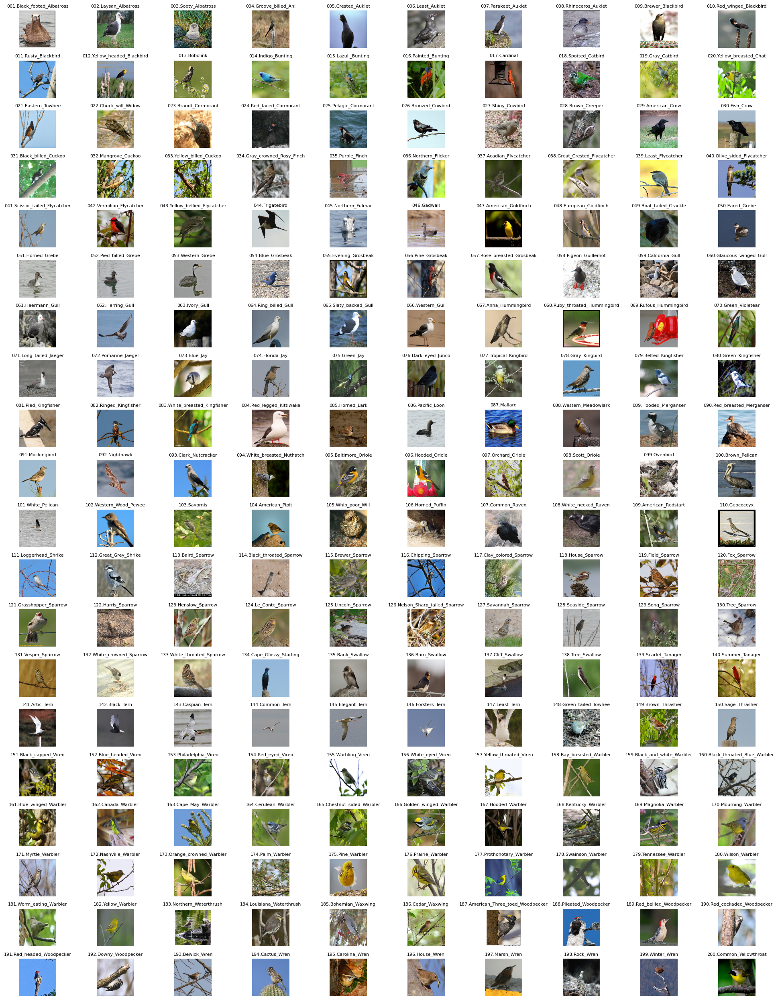

In [4]:
class_names = {v: k for k, v in train_generator.class_indices.items()}
representatives = {class_name: None for class_name in class_names.values()}

for images, labels in train_generator:
    for i in range(images.shape[0]):
        class_index = np.argmax(labels[i])
        class_name = class_names[class_index]
        if representatives[class_name] is None:
            representatives[class_name] = (images[i] * 255).astype("uint8") 
            
    if all(image is not None for image in representatives.values()):
        break

plt.figure(figsize=(20, 25))
for i, (class_name, image) in enumerate(representatives.items()):
    plt.subplot(20, 10, i + 1)
    plt.imshow(image.astype("uint8"))
    plt.title(class_name, fontsize=8)
    plt.axis("off")
plt.tight_layout()
plt.show()

Num GPUs Available:  1


/home/des/suns/env/lib/python3.11/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/40
200/200 ━━━━━━━━━━━━━━━━━━━━ 17s 65ms/step - accuracy: 0.0059 - loss: 5.7762 - top-1-accuracy: 0.0059 - top-2-accuracy: 0.0088 - top-3-accuracy: 0.0124 - val_accuracy: 0.0063 - val_loss: 5.2938 - val_top-1-accuracy: 0.0063 - val_top-2-accuracy: 0.0137 - val_top-3-accuracy: 0.0213
Epoch 2/40
200/200 ━━━━━━━━━━━━━━━━━━━━ 13s 61ms/step - accuracy: 0.0084 - loss: 5.2906 - top-1-accuracy: 0.0084 - top-2-accuracy: 0.0155 - top-3-accuracy: 0.0231 - val_accuracy: 0.0037 - val_loss: 5.2292 - val_top-1-accuracy: 0.0037 - val_top-2-accuracy: 0.0162 - val_top-3-accuracy: 0.0213
Epoch 3/40
200/200 ━━━━━━━━━━━━━━━━━━━━ 12s 58ms/step - accuracy: 0.0116 - loss: 5.1848 - top-1-accuracy: 0.0116 - top-2-accuracy: 0.0179 - top-3-accuracy: 0.0266 - val_accuracy: 0.0137 - val_loss: 5.0217 - val_top-1-accuracy: 0.0137 - val_top-2-accuracy: 0.0250 - val_top-3-accuracy: 0.0375
Epoch 4/40
200/200 ━━━━━━━━━━━━━━━━━━━━ 12s 59ms/step - accuracy: 0.0113 - loss: 4.9708 - top-1-accuracy: 0.0113 - top-2-acc

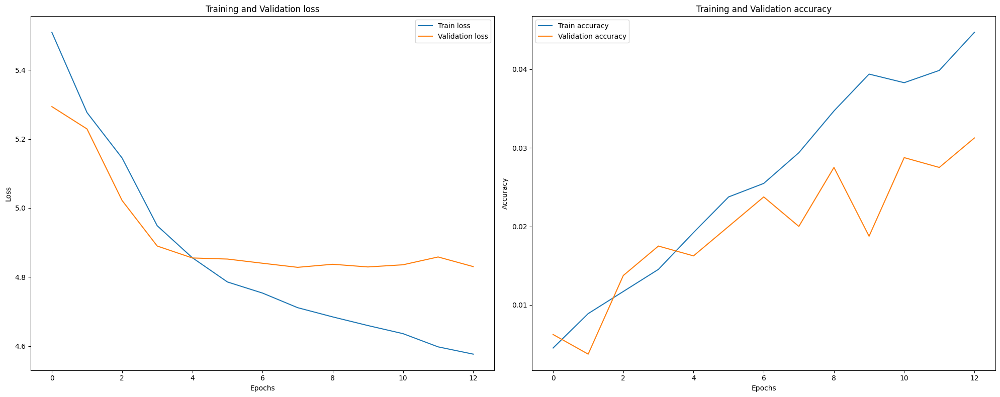

In [ ]:
print("Num GPUs Available: ", len(tf.config.list_physical_devices('GPU')))
model = keras.Sequential()

model.add(layers.Conv2D(16, (3, 3), activation='relu', input_shape=(img_size[0], img_size[1], 3)))
model.add(layers.MaxPooling2D((2, 2)))

model.add(tf.keras.layers.Dropout(0.1))
model.add(layers.Conv2D(64, (3, 3), activation='relu', kernel_regularizer=regularizers.l2(0.01), bias_regularizer=regularizers.l2(0.01)))
model.add(layers.MaxPooling2D((2, 2)))

model.add(tf.keras.layers.Dropout(0.15))
model.add(layers.Conv2D(64, (3, 3), activation='relu', kernel_regularizer=regularizers.l2(0.01), bias_regularizer=regularizers.l2(0.01)))
model.add(layers.MaxPooling2D((2, 2)))

model.add(layers.Flatten())
#model.add(tf.keras.layers.Dropout(0.4))
model.add(layers.Dense(128, activation='relu', kernel_regularizer=regularizers.l2(0.001), bias_regularizer=regularizers.l2(0.001)))

model.add(layers.Dense(200, activation='softmax'))

optimizer = tf.keras.optimizers.Adam(learning_rate=0.001)
model.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy', keras.metrics.TopKCategoricalAccuracy(k=1, name="top-1-accuracy"),
                                                                              keras.metrics.TopKCategoricalAccuracy(k=2, name="top-2-accuracy"),
                                                                              keras.metrics.TopKCategoricalAccuracy(k=3, name="top-3-accuracy")])
early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
history = model.fit(train_generator, epochs=40, verbose=1, validation_data=validation_generator, callbacks=[early_stopping])

loss, accurracy, top_1_accuracy, top_2_accuracy, top_3_accuracy = model.evaluate(test_generator)
train_loss, train_accurracy, train_top_1_accuracy, traint_top_2_accuracy, train_top_3_accuracy = model.evaluate(train_generator)
#print(f'Test accuracy: {accurracy:.4f}')
print(f'Test top 3 accuracy: {top_3_accuracy:.4f}')
print(f'Test top 2 accuracy: {top_2_accuracy:.4f}')
print(f'Test top 1 accuracy: {top_1_accuracy:.4f}')
#print(f'Training accuracy: {train_accurracy:.4f}')
print(f'Training top 3 accuracy: {train_top_3_accuracy:.4f}')
print(f'Training top 2 accuracy: {traint_top_2_accuracy:.4f}')
print(f'Training top 1 accuracy: {train_top_1_accuracy:.4f}')
plt.figure(figsize=(20, 8))
plt.subplot(1,2,1)
sns.lineplot(x=range(len(history.history['loss'])), y=history.history['loss'], label="Train loss")
sns.lineplot(x=range(len(history.history['val_loss'])), y=history.history['val_loss'], label="Validation loss")
plt.title("Training and Validation loss")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

plt.subplot(1,2,2)
sns.lineplot(x=range(len(history.history['accuracy'])), y=history.history['accuracy'], label="Train accuracy")
sns.lineplot(x=range(len(history.history['val_accuracy'])), y=history.history['val_accuracy'], label="Validation accuracy")
plt.title("Training and Validation accuracy")
plt.xlabel("Epochs")
plt.ylabel("Accuracy")
plt.legend()

plt.tight_layout()
plt.show()

13/13 ━━━━━━━━━━━━━━━━━━━━ 4s 199ms/step


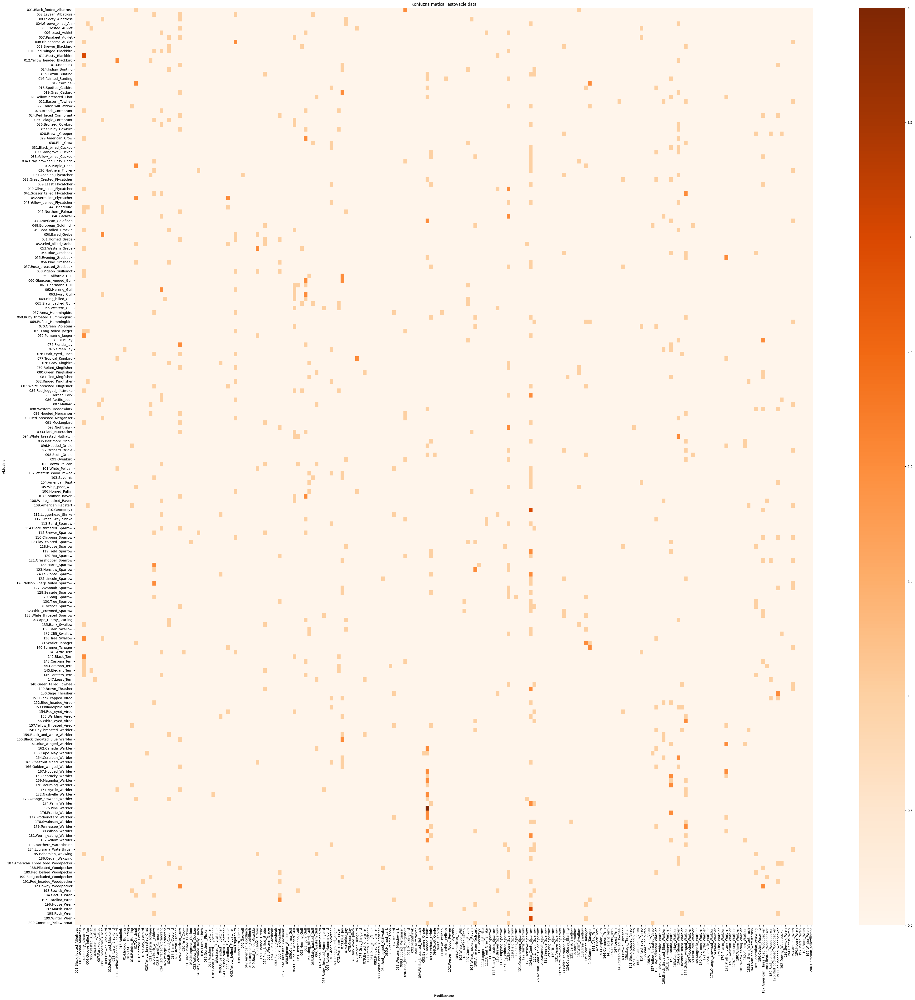

In [27]:
y_pred = np.argmax(model.predict(test_generator), axis=1) 
y_true_test = test_generator.classes
conf_matrix = confusion_matrix(y_true_test, y_pred)

plt.figure(figsize=(50,50))

sns.heatmap(conf_matrix, annot=False, fmt='d', cmap='Oranges', xticklabels=test_generator.class_indices.keys(), yticklabels=test_generator.class_indices.keys())
plt.title("Konfuzna matica Testovacie data")
plt.xlabel("Predikovane")
plt.ylabel("Aktualne")

plt.show()


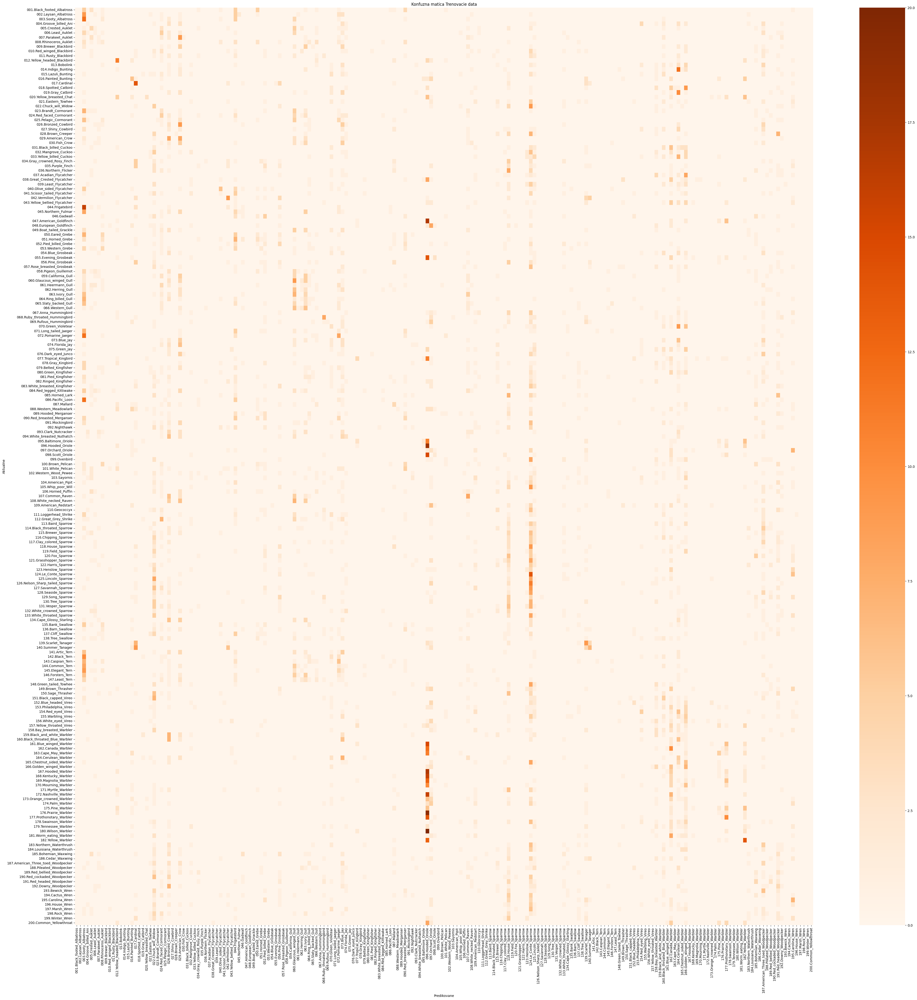

In [ ]:
y_true, y_pred_classes, class_labels = getPredictionsTrain(model, train_generator)
y_true_classes = np.argmax(y_true, axis=1)
conf_matrix = confusion_matrix(y_true_classes, y_pred_classes)
#plt.subplot(1,2,2)
plt.figure(figsize=(50,50))
sns.heatmap(conf_matrix, annot=False, fmt='d', cmap='Oranges', xticklabels=class_labels, yticklabels=class_labels)
plt.title("Konfuzna matica Trenovacie data")
plt.xlabel("Predikovane")
plt.ylabel("Aktualne")
plt.show()

In [78]:
train_generator = train_datagen.flow_from_directory(
    directory='bird_dataset/train',
    color_mode='rgb',
    class_mode='categorical',
    batch_size=batch_size,
    target_size=img_size,
    shuffle=False)

def extractFeaturesToDf(generator, model, dataset_type):
    features = []  
    image_paths = []  
    labels = [] 
    class_names = {v: k for k, v in generator.class_indices.items()}
    
    
    for _ in range(generator.num_batches):
        images, batch_labels = next(generator)
        batch_features = model.predict(images, verbose=1)

        features.extend(batch_features)
        image_paths.extend(generator.filepaths[_ * generator.batch_size : (_ + 1) * generator.batch_size])
        labels.extend(np.argmax(batch_labels, axis=1))

    df = pd.DataFrame(features)
    df['image_path'] = image_paths
    df['label'] = labels
    df['class'] = df['label'].map(class_names)
    df['dataset_type'] = dataset_type
    return df

base_model = MobileNetV2(weights='imagenet', include_top=False, pooling='avg',  input_shape=(img_size[0], img_size[1], 3))
print("train_df processing")
train_df = extractFeaturesToDf(train_generator, base_model, 'train')
print("validation_df processing")
validation_df = extractFeaturesToDf(validation_generator, base_model, 'validation')
print("test_df processing")
test_df = extractFeaturesToDf(test_generator, base_model, 'test')

birds_df = pd.concat([train_df, validation_df, test_df], axis=0, ignore_index=True)
birds_df.to_csv('birds_df.csv', index=False)


Found 6400 images belonging to 200 classes.
train_df processing
2/2 ━━━━━━━━━━━━━━━━━━━━ 2s 273ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 22ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step
2/2 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
2/2 ━━━━━━━━━━━━━━━━━━━

In [10]:
birds_features = pd.read_csv('birds_df.csv').iloc[:, :-4].values
scaler = StandardScaler()
pca = PCA(n_components=0.85)
birds_features_scaled = scaler.fit_transform(birds_features)
birds_features_pca = pca.fit_transform(birds_features_scaled)

n_clusters = 10
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
clusters = kmeans.fit_predict(birds_features_pca)

birds_df = pd.read_csv('birds_df.csv')
birds_df['cluster'] = clusters

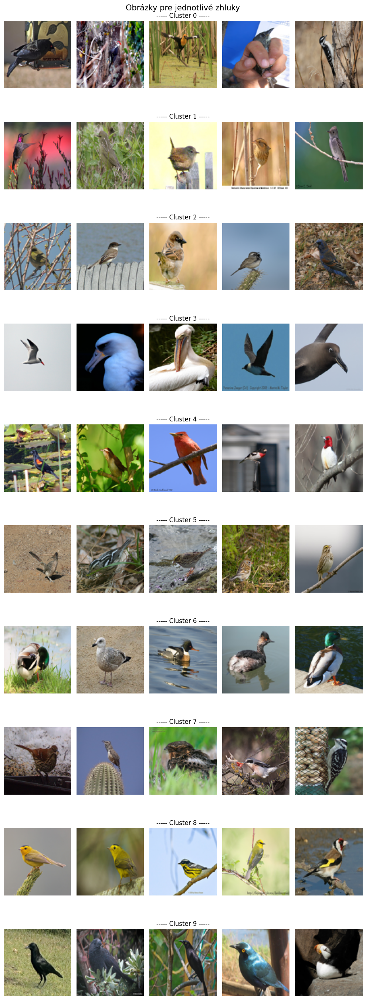

In [11]:
n_images_per_cluster = 5
fig, axes = plt.subplots(n_clusters, n_images_per_cluster, figsize=(10, 28))
fig.suptitle("Obrázky pre jednotlivé zhluky", fontsize=15)

for cluster in range(n_clusters):
    # Náhodný výber obrázkov z aktuálneho zhluku
    cluster_images = birds_df[birds_df['cluster'] == cluster]['image_path'].values
    if len(cluster_images) > n_images_per_cluster:
        cluster_images = np.random.choice(cluster_images, n_images_per_cluster, replace=False)

    for i, img_path in enumerate(cluster_images):
        img = Image.open(img_path).resize((100, 100))
        axes[cluster, i].imshow(img)
        axes[cluster, i].axis('off')

    # Označenie stredu riadku názvom zhluku
    axes[cluster, n_images_per_cluster // 2].set_title(f"----- Cluster {cluster} -----", fontsize=12, loc='center')

plt.tight_layout()
plt.show()

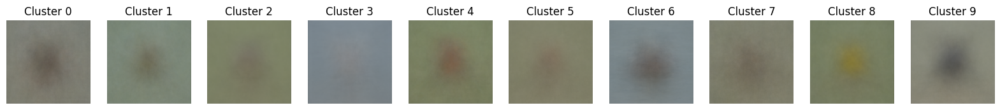

In [12]:
# Funkcia na výpočet priemerného obrázku
def compute_average_image(df, cluster):
    cluster_images = df[df['cluster'] == cluster]['image_path'].values
    imgs = [np.array(Image.open(img_path).resize((224, 224)).convert('RGB')) for img_path in cluster_images]
    avg_img = np.mean(imgs, axis=0).astype(np.uint8)
    return avg_img

# Zobrazenie priemerných obrázkov
fig, axes = plt.subplots(1, n_clusters, figsize=(20, 5))
for cluster in range(n_clusters):
    avg_img = compute_average_image(birds_df, cluster)
    axes[cluster].imshow(avg_img)
    axes[cluster].axis('off')
    axes[cluster].set_title(f'Cluster {cluster}')
plt.show()

model accuracy: 0.495625
model accuracy train: 1.0


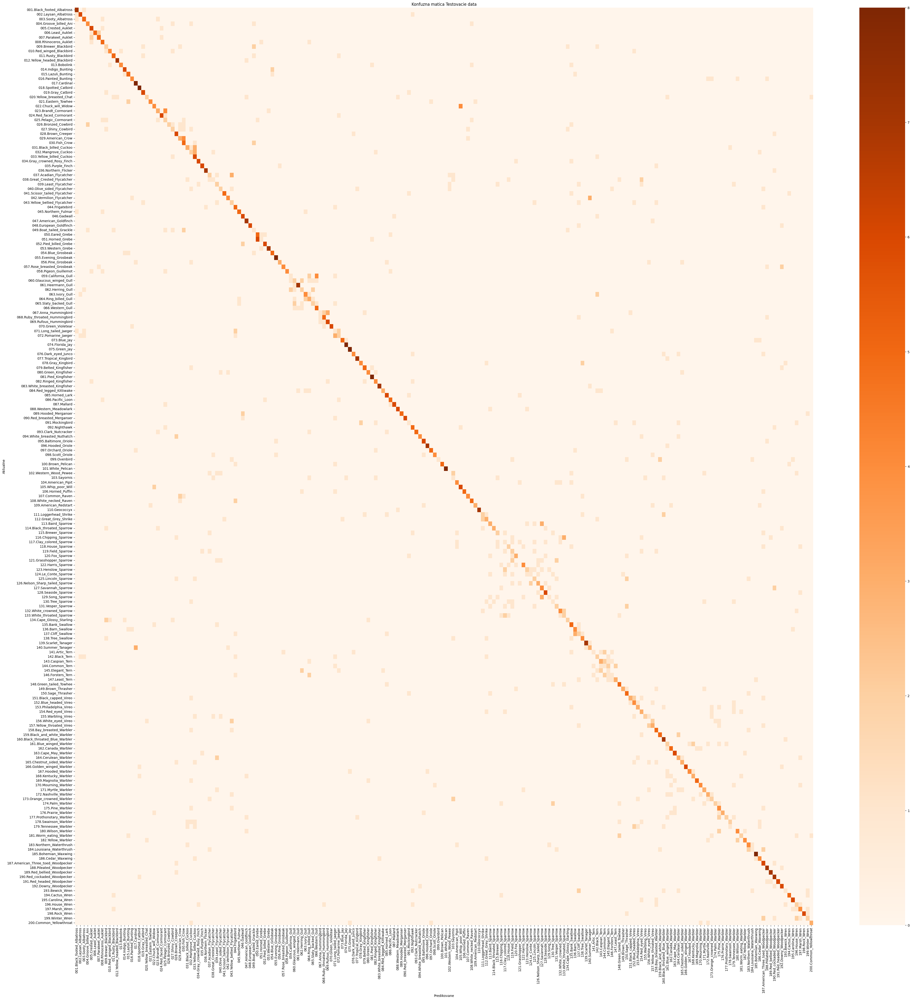

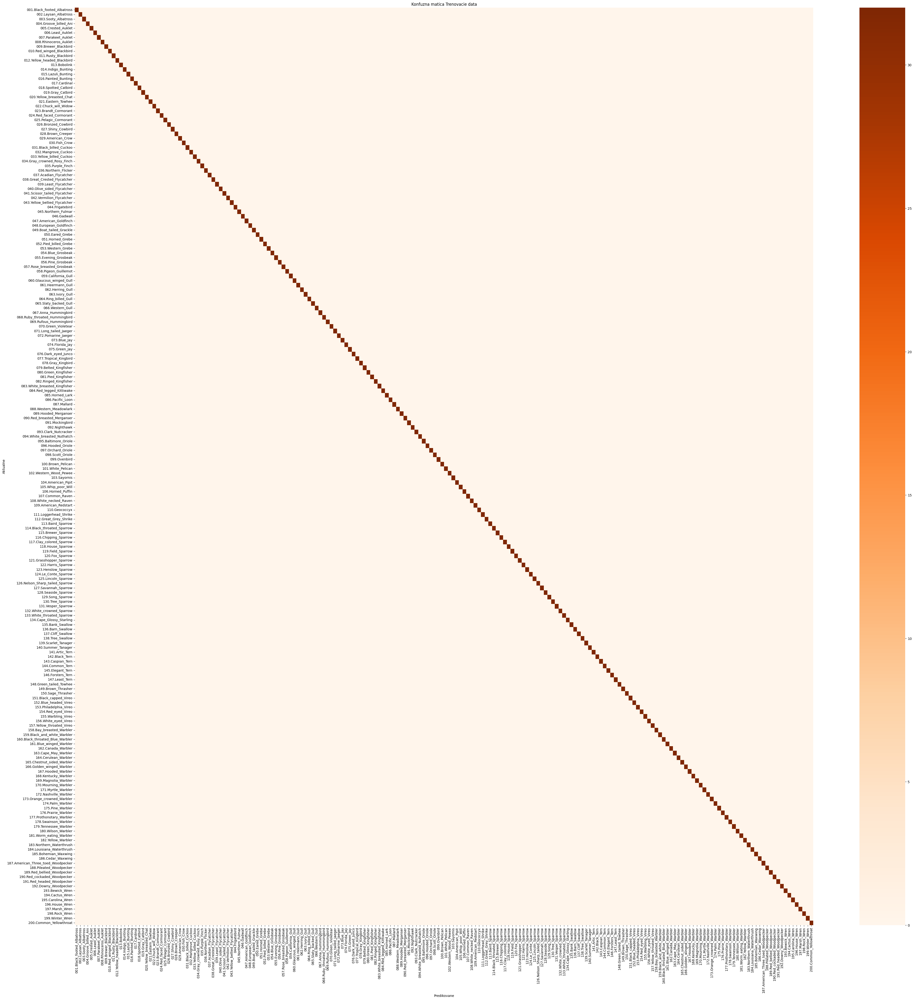

In [ ]:
scaler = MinMaxScaler()
X_train = scaler.fit_transform(birds_df[(birds_df['dataset_type'] == 'train') ].iloc[:, :-5].values)
Y_train = birds_df[(birds_df['dataset_type'] == 'train') ]['label'].values
X_test = scaler.transform(birds_df[birds_df['dataset_type'] == 'test'].iloc[:, :-5].values)
Y_test = birds_df[birds_df['dataset_type'] == 'test']['label'].values
#Classifier
model = SVC(kernel='rbf', C=300)
model.fit(X_train, Y_train)

y_pred = model.predict(X_test)
y_pred_train = model.predict(X_train)

accurracy = accuracy_score(Y_test, y_pred)
accurracy_train = accuracy_score(Y_train, y_pred_train)
print(f"model accuracy: {accurracy}")
print(f"model accuracy train: {accurracy_train}")

class_labels = list(train_generator.class_indices.keys())
conf_matrix = confusion_matrix(Y_test, y_pred)
plt.figure(figsize=(50, 50))
sns.heatmap(conf_matrix, fmt='d', cmap='Oranges',  xticklabels=class_labels, yticklabels=class_labels)
plt.title("Konfuzna matica Testovacie data")
plt.xlabel("Predikovane")
plt.ylabel("Aktualne")

plt.figure(figsize=(50, 50))
conf_matrix = confusion_matrix(Y_train, y_pred_train)
sns.heatmap(conf_matrix, fmt='d', cmap='Oranges',  xticklabels=class_labels, yticklabels=class_labels)
plt.title("Konfuzna matica Trenovacie data")
plt.xlabel("Predikovane")
plt.ylabel("Aktualne")
plt.show()

model accuracy: 0.92625
model accuracy train: 1.0


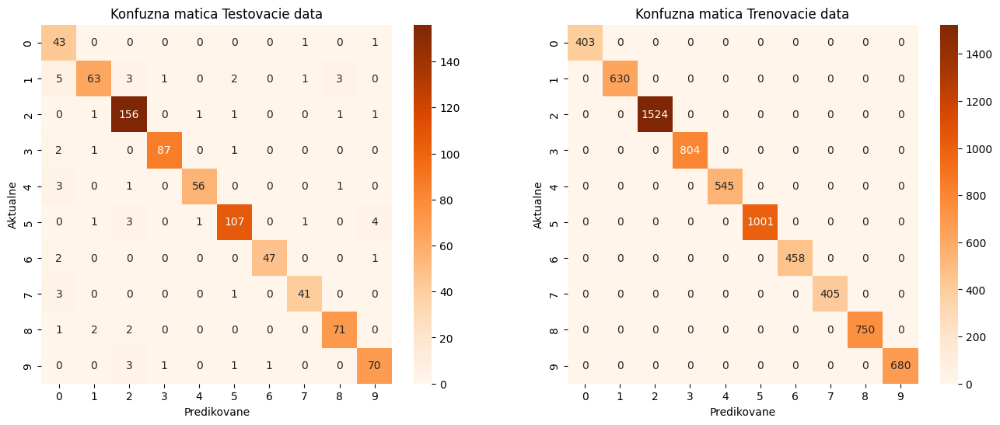

In [13]:
#trenovanie na clusteroch
X_train = scaler.fit_transform(birds_df[(birds_df['dataset_type'] == 'train') | (birds_df['dataset_type'] == 'validation')].iloc[:, :-5].values)
Y_train = birds_df[(birds_df['dataset_type'] == 'train')| (birds_df['dataset_type'] == 'validation') ]['cluster'].values
X_test = scaler.transform(birds_df[birds_df['dataset_type'] == 'test'].iloc[:, :-5].values)
Y_test = birds_df[birds_df['dataset_type'] == 'test']['cluster'].values

model = SVC(kernel='rbf', C=300)
model.fit(X_train, Y_train)

y_pred = model.predict(X_test)
y_pred_train = model.predict(X_train)

accurracy = accuracy_score(Y_test, y_pred)
accurracy_train = accuracy_score(Y_train, y_pred_train)
print(f"model accuracy: {accurracy}")
print(f"model accuracy train: {accurracy_train}")

conf_matrix = confusion_matrix(Y_test, y_pred)
plt.figure(figsize=(16,6))
plt.subplot(1,2,1)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Oranges')
plt.title("Konfuzna matica Testovacie data")
plt.xlabel("Predikovane")
plt.ylabel("Aktualne")


conf_matrix = confusion_matrix(Y_train, y_pred_train)
plt.subplot(1,2,2)
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Oranges')
plt.title("Konfuzna matica Trenovacie data")
plt.xlabel("Predikovane")
plt.ylabel("Aktualne")
plt.show()

/tmp/ipykernel_31046/5155283.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=clusters, y=accuracies, palette="viridis")


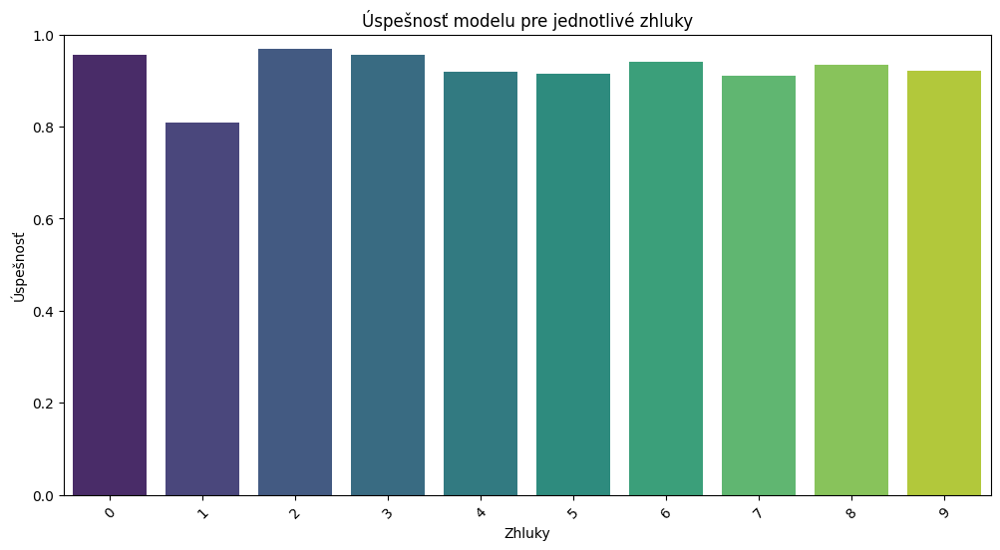

In [14]:
cluster_accuracies = []
clusters = np.unique(Y_test)
for cluster in clusters:
    cluster_mask = Y_test == cluster
    cluster_accuracy = accuracy_score(Y_test[cluster_mask], y_pred[cluster_mask])
    cluster_accuracies.append((cluster, cluster_accuracy))


clusters, accuracies = zip(*cluster_accuracies)
plt.figure(figsize=(12, 6))
sns.barplot(x=clusters, y=accuracies, palette="viridis")
plt.title("Úspešnosť modelu pre jednotlivé zhluky")
plt.xlabel("Zhluky")
plt.ylabel("Úspešnosť")
plt.xticks(rotation=45)
plt.ylim(0, 1)
plt.show()